# Lane and curvature detection

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
from pylab import *

import pickle
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import glob
from skimage import data, img_as_float
from skimage import exposure

%matplotlib inline

## Camera Caliberation data

In [2]:
try:
    file = open('cam_calib_imgpoints_objpoints.pkl', 'rb')
    imgpoints = pickle.load(file)
    objpoints = pickle.load(file)
except FileNotFoundError:
    print ('please run Camera_calib.ipynb to generate the camera caliberation data.')
    print ('data will be generated in file cam_calib_imgpoints_objpoints.pkl')

In [3]:
#reffered from https://stackoverflow.com/questions/43240604/python-local-normalization-in-opencv

def local_normalize(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    gray,u,v = cv2.split(gray)
    float_gray = gray.astype(np.float32) / 255.0

    blur = cv2.GaussianBlur(float_gray, (0, 0), sigmaX=2, sigmaY=2)
    num = float_gray - blur

    blur = cv2.GaussianBlur(num*num, (0, 0), sigmaX=20, sigmaY=20)
    den = cv2.pow(blur, 0.5)

    gray = num / den

    cv2.normalize(gray, dst=gray, alpha=0.0, beta=1.0, norm_type=cv2.NORM_MINMAX)
    gray = gray*255
    gray = gray.astype(np.uint8)
    yuv = cv2.merge((gray,u,v))
    return cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)

   ### 2. Apply a distortion correction to raw images.
      Use the camera caliberation data obtained from cam_calib_imgpoints_objpoints1.pk file to undistort the images.

In [4]:
# TODO: Write a function that takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (720, 1280), None, None)
def cal_undistort(img, objpoints, imgpoints, mtx = mtx, dist = dist):
    #ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2:], None, None)   
    return cv2.undistort(img, mtx, dist, None, mtx)

In [5]:
#function to compare 2 images side by side
def compare_images(img1, img2, text1 = 'img1', text2 = 'img2'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(48, 18))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(text1, fontsize=40)
    ax2.imshow(img2)
    ax2.set_title(text2, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [6]:
#function to compare two images vertically (bigger on appearance)
def compare_images_V(img1, img2, text1 = 'img1', text2 = 'img2'):
    f, (ax1, ax2) = plt.subplots(2, 1, figsize=(48, 18))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(text1, fontsize=40)
    ax2.imshow(img2)
    ax2.set_title(text2, fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

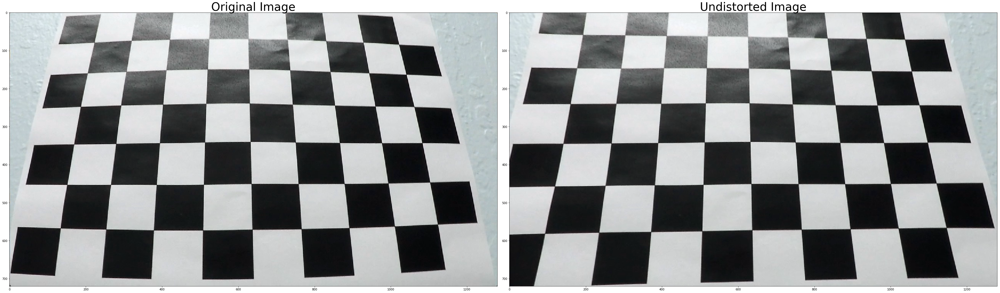

In [7]:
#un-comment the block to check caliberation
img = cv2.imread('camera_cal/calibration3.jpg')
#img = cv2.imread('test_images/test21.jpg')
img = cv2.resize(img, (1280, 720)) 
undistorted = cal_undistort(img, objpoints, imgpoints)

compare_images(img, undistorted, text1 = 'Original Image', text2 = 'Undistorted Image')

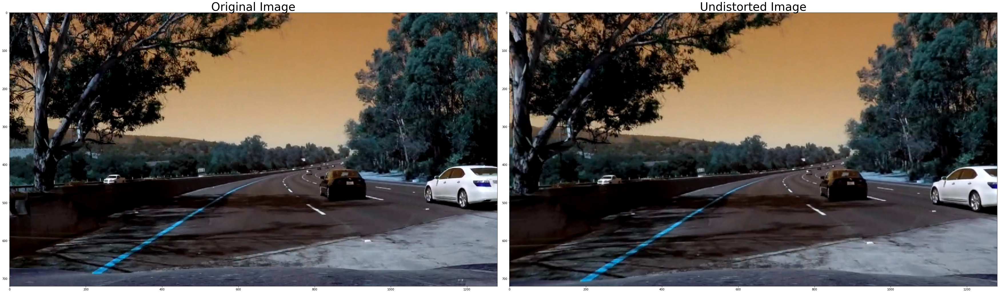

In [8]:
#un-comment the block to check caliberation
#img = cv2.imread('camera_cal/calibration3.jpg')
img = cv2.imread('test_images/test21.jpg')
img = cv2.resize(img, (1280, 720)) 
undistorted = cal_undistort(img, objpoints, imgpoints)

compare_images(img, undistorted, text1 = 'Original Image', text2 = 'Undistorted Image')

In [9]:
def region_of_interest(img):
    """
    Applies an image mask.
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    imshape = img.shape
    vertices = np.array([[(240,720), (240, 10), (1100, 10), (1100, 720)]], dtype=np.int32) #677
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [10]:
def corners_unwarp(img, objpoints, imgpoints):
    """
    this function does the perspective transform and wraps from the image.
    """
    # 1) Undistort using mtx and dist
    
    img_size = img.shape
    shape = (img_size[1], img_size[0])
    
    src = np.array([[574, 465],
                    [700, 465],
                    [245, 684],
                    [1050, 684]], np.float32)

    dst = np.array([[320, 0],
                    [926, 0],
                    [320,720],
                    [920, 720]], np.float32)
    # d)cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # e) use cv2.warpPerspective() to warp your image to a top-down view
    gray = cv2.warpPerspective(img, M,  shape, flags = cv2.INTER_LINEAR )
    gray = cal_undistort(gray, objpoints, imgpoints)
    return region_of_interest(gray)
    #return gray

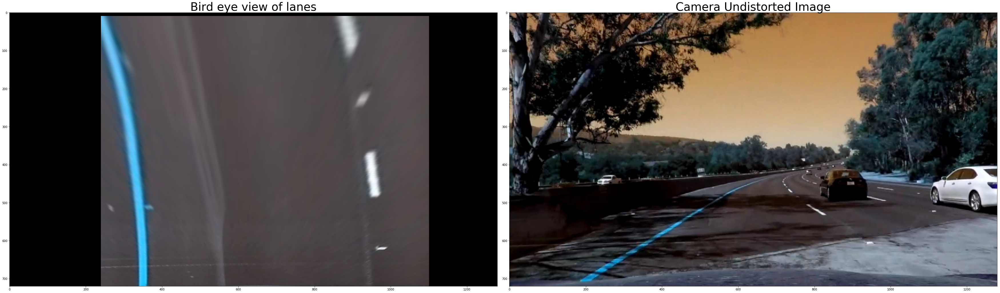

In [11]:
img = cv2.imread('test_images/test11.jpg')
img = cv2.resize(img, (1280, 720)) 

img_unwrap = corners_unwarp(img, objpoints, imgpoints)
compare_images(img_unwrap, undistorted, text1 = 'Bird eye view of lanes', text2 = 'Camera Undistorted Image')

### This function does exactly opposite to the above unwrap function
Src and dst arrays are swaped compared to corners_unwarp()

In [12]:
def corners_warp(undistorted_img, objpoints, imgpoints):

    # 1) Undistort using mtx and dist
    #undistorted_img = cal_undistort(undistorted_img, objpoints, imgpoints)
    img_size = undistorted_img.shape
    shape = (img_size[1], img_size[0])

    dst = np.array([[574, 465],
                    [700, 465],
                    [245, 684],
                    [1050, 684]], np.float32)
    
    src = np.array([[320, 0],
                    [926, 0],
                    [320,720],
                    [920, 720]], np.float32)
    # d)cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    # e) use cv2.warpPerspective() to warp your image to a top-down view
    gray = cv2.warpPerspective(undistorted_img, M,  shape, flags = cv2.INTER_LINEAR )
    return region_of_interest(gray)

### Trials


local_normalize

A channel is affected by the shadows

A and B Chanbels are good against any color of the road.L Channel is good for white lines

In [13]:
def bin_pipeline(img, s_thresh=(100, 180), sx_thresh=(25, 80)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    color_binary = np.dstack(( np.zeros_like(s_binary), s_binary, sxbinary)) * 255
    return color_binary

In [14]:
def modern_pipeline_mix(img):
  
    
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    # define range of blue color in HSV
    lower_white = np.array([0,0,220])
    upper_while = np.array([255,255,255])
    # Threshold the HSV image to get only blue colors
    mask_white = cv2.inRange(hsv, lower_white, upper_while)

    unwraped = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)

    L = unwraped[:,:,0]
    A = unwraped[:,:,1]
    B = unwraped[:,:,2]

    binary = np.zeros_like(A)
    binary[(A > 0) & (A <= 123)] = 1
    
    #combine white and yellow lines
    binary1 = np.zeros_like(A)
    binary1[(binary !=0) | (mask_white != 0)] = 255

    return binary1

img = cv2.imread('test_images/test7.jpg')
img = cv2.resize(img, (1280, 720)) 
undistorted = cal_undistort(img, objpoints, imgpoints)
unwraped = corners_unwarp(undistorted, objpoints, imgpoints)


In [15]:
def binary_road(img):
    R, G, B = cv2.split(img)
    b_R = np.zeros_like(R)
    b_G = np.zeros_like(R)
    b_B = np.zeros_like(R)

    #b_R[[(R > 180) & (R <= 255)]] = 1
    b_R[[(R > 230) & (R <= 255)]] = 1
    b_G[[(G > 200) & (G <= 255)]] = 1
    b_B[[(B > 200) & (B <= 255)]] = 1

    #ret2,th2 = cv.threshold(modern_pipeline_mix(img),0,255,cv.THRESH_BINARY+cv.THRESH_OTSU)


    unwraped1 = cv2.merge((b_R, b_G, b_B))*255
    ret2,th2 = cv2.threshold(cv2.cvtColor(unwraped1, cv2.COLOR_RGB2GRAY),0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    #HLS = cv2.cvtColor(unwraped1, cv2.COLOR_RGB2LAB)
    #H,L,S = cv2.split(HLS)
    #compare_images_V(th2, modern_pipeline_mix(img), text1 = 'Y channel', text2 = 'U channel')    
    th2 = th2 | modern_pipeline_mix(img)

    
    return th2

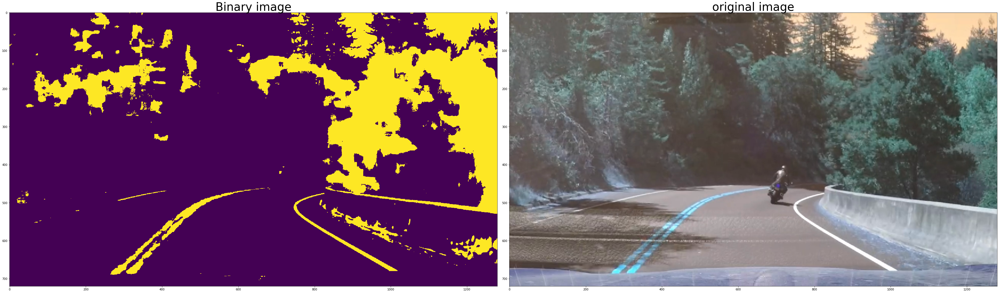

In [16]:
img = cv2.imread('test_images/h_test11.jpg')
img1 = cv2.resize(img, (1280, 720)) 
#undistorted = cal_undistort(img, objpoints, imgpoints)
#img = cv2.equalizeHist(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY))
unwraped = corners_unwarp(undistorted, objpoints, imgpoints)


compare_images((binary_road(img1)), img1, text1 = 'Binary image', text2 = 'original image')


In [17]:
class lines:
    def __init__ (self, new):
        self.found = new
    
    frame_num = 0
    left_fit_buff = np.array([[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0]\
                             ,[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0]])
    left_fit = np.array([0,0,0])
    #left_fit_buff = np.empty((0,3), int)
    right_fit_buff = np.array([[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0]\
                             ,[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0],[0.0,0.0,0.0]])
    #right_fit_buff = []
    right_fit = np.array([0,0,0])
    leftx = []
    lefty = []
    rightx = []
    righty = []
    

    def find_lane_pixels(self, binary_warped):

        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)

        # Create an output image to draw on and visualize the result
        #out_img = np.dstack((binary_warped, binary_warped, binary_warped))


        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]//2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # HYPERPARAMETERS
        # Choose the number of sliding windows
        nwindows = 9
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 80

        # Set height of windows - based on nwindows above and image shape
        window_height = np.int(binary_warped.shape[0]//nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = binary_warped.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated later for each window in nwindows
        leftx_current = leftx_base
        rightx_current = rightx_base

        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin

            #print (win_xright_low, win_xright_high)

            #Draw the windows on the visualization image. Uncomment for debug purpose.
            
            #cv2.rectangle(binary_warped,(win_xleft_low,win_y_low),
            #(win_xleft_high,win_y_high),(0,255,0), 2) 
            #cv2.rectangle(binary_warped,(win_xright_low,win_y_low),
            #(win_xright_high,win_y_high),(0,255,0), 2) 

            
            
            # Identify the nonzero pixels in x and y within the window #
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            #print ("got ")
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        if np.sum(right_lane_inds, axis = 0) > 10000:
            self.found = 1
            self.leftx = nonzerox[left_lane_inds]
            self.lefty = nonzeroy[left_lane_inds]
        if np.sum(right_lane_inds, axis = 0) > 1000:
            self.found = 1
            self.rightx = nonzerox[right_lane_inds]
            self.righty = nonzeroy[right_lane_inds]
        
        # fit a curve and add it to the buffer
        self.left_fit_buff[1] =  np.polyfit(self.lefty, self.leftx, 2)
        self.right_fit_buff[1] = np.polyfit(self.righty, self.rightx, 2)
        
        #save the current frames curve fit
        self.left_fit =  np.polyfit(self.lefty, self.leftx, 2)
        self.right_fit = np.polyfit(self.righty, self.rightx, 2)

        return 
    
    # Polynomial fit values from the previous frame
# Make sure to grab the actual values from the previous step in your project!


    def fit_poly(self,img_shape):
        indx = self.frame_num%10
        avg = 0
        
        if self.frame_num < 10:
            avg = self.frame_num
        else:
            avg = 10
        
         ### TO-DO: Fit a second order polynomial to each with np.polyfit() ###
        try:
            self.left_fit_buff[indx] =   np.polyfit(self.lefty, self.leftx, 2)
            self.left_fit = np.sum(self.left_fit_buff, axis = 0)/avg
        except:
            pass
        
        
        try:
            self.right_fit_buff[indx] =  np.polyfit(self.righty, self.rightx, 2)
            self.right_fit = np.sum(self.right_fit_buff, axis = 0)/avg

        except:
            pass
        
        # Generate x and y values for plotting
        ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
        ### TO-DO: Calc both polynomials using ploty, left_fit and right_fit ###
        left_fitx = self.left_fit[0]*ploty**2 + self.left_fit[1]*ploty + self.left_fit[2]
        right_fitx = self.right_fit[0]*ploty**2 + self.right_fit[1]*ploty + self.right_fit[2]
        return left_fitx, right_fitx, ploty
    
    def find_cruve(self, left_fitx, right_fitx, ploty, shape1):
        # Define conversions in x and y from pixels space to meters
        ym_per_pix = 15/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/650 # meters per pixel in x dimension
        
        #Fit a second order polynomial to pixel positions in each curve fit
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
        
        #x coordinates at the botton of the image, that is exactly below the car
        l = self.left_fit[0]*shape1[0]**2 + self.left_fit[1]*shape1[0] + self.left_fit[2]
        r = self.right_fit[0]*shape1[0]**2 + self.right_fit[1]*shape1[0] + self.right_fit[2]
        
        
        lane_center = (r+l)/2
        #considering camera is exactly at the center, perfectly focused at front
        car_center = shape1[1]/2
        #deviation of the car, within the lane
        deviation = (car_center - lane_center)*xm_per_pix
        
        
        # We'll choose the maximum y-value, corresponding to the bottom of the image
        y_eval = np.max(ploty)
        
        # Calculation of R_curve (radius of curvature)
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        
        curve = (left_curverad + right_curverad)/2
        #sto = 'curve is' + str(curve)
        #print ('curve is',sto)
        return curve, deviation
        
    def search_around_poly(self, binary_warped):        
        shape1 = binary_warped.shape
        self.frame_num = self.frame_num + 1
        
        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
        
        window_img = np.zeros_like(out_img)
        # HYPERPARAMETER
        # Choose the width of the margin around the previous polynomial to search
        # The quiz grader expects 100 here, but feel free to tune on your own!
        margin = 100
        #find out the lane pixels from the binary image
        nonzero = binary_warped.nonzero()
        #y coordinates of the lane pixes
        nonzeroy = np.array(nonzero[0])
        #x coordinates of the lane pixels
        nonzerox = np.array(nonzero[1])
        
        #if this is new start, and lanes were never detected, use histogram 
        #i.e. window search methode to detect the lanes
        if self.found == 0:
            self.find_lane_pixels(binary_warped)
            self.fit_poly(shape1)
     
        #Use the lane fits (left_fit & right_fit) to see if the above detected non-zero pixels are 
        #in range of 'margin' on both left and right side of each lane. 
        left_lane_inds = ((nonzerox > (self.left_fit[0]*(nonzeroy**2) + self.left_fit[1]*nonzeroy + 
                        self.left_fit[2] - margin)) & (nonzerox < (self.left_fit[0]*(nonzeroy**2) + 
                        self.left_fit[1]*nonzeroy + self.left_fit[2] + margin)))
        right_lane_inds = ((nonzerox > (self.right_fit[0]*(nonzeroy**2) + self.right_fit[1]*nonzeroy + 
                        self.right_fit[2] - margin)) & (nonzerox < (self.right_fit[0]*(nonzeroy**2) + 
                        self.right_fit[1]*nonzeroy + self.right_fit[2] + margin)))

        # Again, extract left and right line pixel positions
        #Since in all the data set, the lane always had solid lane (yellow or white) the number of
        #pixels detected were usually more than 10000. hence using it as a minimum threshold for left
        #lane. If pixels detected are more than 10000, only then replace the pixels detected from the
        #previous frame, or else keep the pixels from the previous frame
        if np.sum(left_lane_inds, axis = 0) > 10000:
            self.leftx = nonzerox[left_lane_inds]
            self.lefty = nonzeroy[left_lane_inds] 
        #else:
            #self.found = 0
            
        # Same as above. But since the right lane was usually not solid, minimum pixels or threshold was 
        #set to 1000. rest is same as explained above.
        
        if np.sum(right_lane_inds, axis = 0) > 1000:
            self.rightx = nonzerox[right_lane_inds]
            self.righty = nonzeroy[right_lane_inds]
        #else:
            #self.found = 0
            
        #use the above detected left and right lane pixes (leftx, rightx, lefty, righty) to plot
        #a polynomial curve of order 2, and obtain it's pixels in the form of arrays. ploty is just all
        #the pixels for vertical order, i.e. 0 to hight of the image i.e. 720 here.
        left_fitx, right_fitx, ploty = self.fit_poly(shape1)
 
        
        # re-arrange/shape the arrays detected above to use them for drawing cv2.polylines. 
        left_line = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
        right_line = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
        #use both the lines, to describe the entire lane area (rectagle)
        fill_lane = np.hstack((left_line, right_line))
        
        
        # Draw the polynomial lines onto the image, and highlight the detected lane
        cv2.polylines(out_img, np.int32([left_line]), isClosed=False, color=(255,0,0), thickness=10)
        cv2.polylines(out_img, np.int32([right_line]), isClosed=False, color=(0,0,255), thickness=10)
        cv2.fillPoly(out_img, np.int_([fill_lane]), (0,255, 0))
        result = cv2.addWeighted(out_img, 0.6, window_img, 0.5, 0)
        

        
        #find the curvature of the lane and the deviatation of the car from the center 
        #of the lane
        curve, deviation = self.find_cruve(left_fitx, right_fitx, ploty, shape1)
        
        #create strings to paste on the video frame, describing the curvature and deviation of the lanes
        curve = round(curve,3)
        deviation = round(deviation, 3)
        curv_str = 'Curve is ' + str(curve) + 'm'
        if deviation > 0 :
            dev_str = 'Deviation  is ' + str(abs(deviation)) + 'm right of center'
        else:
            dev_str = 'Deviation  is ' + str(abs(deviation)) + 'm left of center'
            
        return result, curv_str, dev_str


(720, 1280, 3)
(720, 1280, 3)


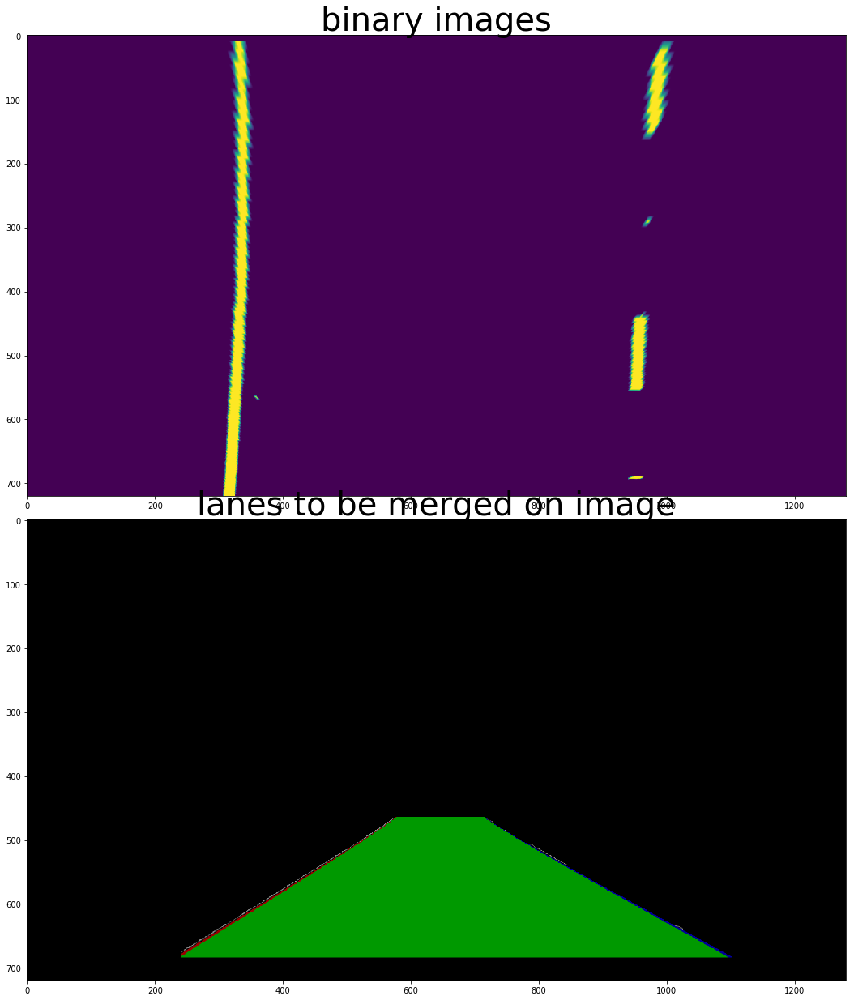

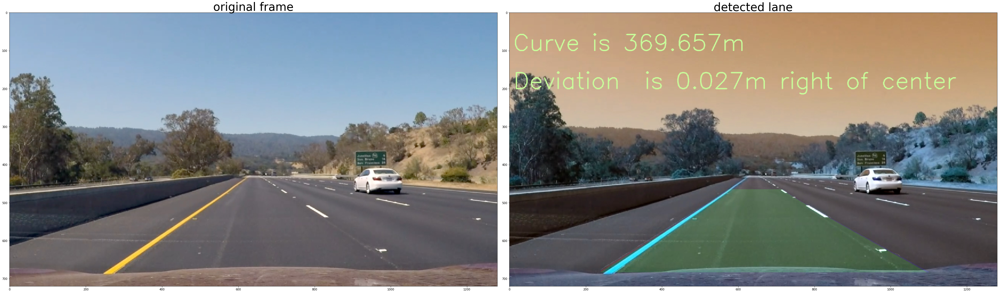

In [18]:


lanes1 = lines(0)
res_1 = cv2.imread('test_images/test13.jpg')

image1 = cv2.resize(res_1, (1280, 720))
image = cv2.cvtColor(image1, cv2.COLOR_RGB2BGR)
#unwraped = corners_unwarp(image, objpoints, imgpoints)
image = exposure.adjust_gamma(image, 0.8)
res2 = binary_road(image)
#res2 = np.dstack((res2, res2, res2))
res2 = corners_unwarp(res2, objpoints, imgpoints)
res1, c,d = lanes1.search_around_poly(res2)
res1 = corners_warp(res1, objpoints, imgpoints)

compare_images_V(res2, res1, text1 = 'binary images', text2 = 'lanes to be merged on image')

print (image.shape)
print (res1.shape)
result = cv2.addWeighted(image1, 1, res1, 0.2, 0)
font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(result, c,(10,100), font, 2, (200,255,155), 2, cv2.LINE_AA)
cv2.putText(result, d,(10,200), font, 2, (200,255,155), 2, cv2.LINE_AA)

compare_images(image, result, text1 = 'original frame', text2 = 'detected lane')



In [19]:

lanes = lines(0)

temp = 1

def process_image(image):
    if temp == 1:
        image1 = cv2.resize(image, (1280, 720))
        image = cv2.cvtColor(image1, cv2.COLOR_RGB2BGR)
        #unwraped = corners_unwarp(image, objpoints, imgpoints)
        image = exposure.adjust_gamma(image, 0.8)
        res2 = binary_road(image)
        #res2 = np.dstack((res2, res2, res2))
        res2 = corners_unwarp(res2, objpoints, imgpoints)
        res1, c,d = lanes.search_around_poly(res2)
        res1 = corners_warp(res1, objpoints, imgpoints)
        result = cv2.addWeighted(image1, 1, res1, 0.5, 0)
        font = cv2.FONT_HERSHEY_SIMPLEX
        cv2.putText(result, c,(10,100), font, 2, (200,255,155), 2, cv2.LINE_AA)
        cv2.putText(result, d,(10,200), font, 2, (200,255,155), 2, cv2.LINE_AA)
        #result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
        
        
        
    else:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        #unwraped = corners_unwarp(image, objpoints, imgpoints)
        image = exposure.adjust_gamma(image, 2)
        result = binary_road(image)
        result = np.dstack((result, result, result))
    return result

white_output = 'demo_challenge_video.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds

clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)


[MoviePy] >>>> Building video demo_challenge_video.mp4
[MoviePy] Writing video demo_challenge_video.mp4


100%|████████████████████████████████████████████████████████████████████████████████| 485/485 [01:49<00:00,  4.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: demo_challenge_video.mp4 

Wall time: 1min 49s
